### Importing the libraries

In [ ]:
import numpy as np
import pandas as pd
import requests
import seaborn as sns

import math
import random

In [ ]:
import yfinance as yf
import matplotlib.pyplot as plt

In [ ]:
import bs4 as bs
import datetime as dt
import os
import pickle
import requests

In [ ]:
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
import pandas_datareader as pdr
%matplotlib inline

## Data Preprocessing

In [ ]:
# Download the CSV file containing S&P 500 stock symbols
url = 'https://datahub.io/core/s-and-p-500-companies/r/constituents.csv'
sp500 = pd.read_csv(url)

sp500

,Symbol,Name,Sector
0,MMM,3M,Industrials
1,AOS,A. O. Smith,Industrials
2,ABT,Abbott Laboratories,Health Care
3,ABBV,AbbVie,Health Care
4,ABMD,Abiomed,Health Care
...,...,...,...
500,YUM,Yum! Brands,Consumer Discretionary
501,ZBRA,Zebra Technologies,Information Technology
502,ZBH,Zimmer Biomet,Health Care
503,ZION,Zions Bancorp,Financials


In [ ]:
df2 = sp500.pivot_table(index = ['Sector'], aggfunc ='size')
print(df2)

Sector
Communication Services    27
Consumer Discretionary    63
Consumer Staples          32
Energy                    21
Financials                65
Health Care               64
Industrials               74
Information Technology    74
Materials                 28
Real Estate               29
Utilities                 28
dtype: int64


In [ ]:
# create a list of sectors to include in the portfolio
sectors = ['Energy', 'Financials', 'Information Technology', 'Health Care']

# create a boolean mask for the tickers in the desired sectors
mask = sp500['Sector'].isin(sectors)

# filter the tickers using the boolean mask
portfolio = sp500[mask]

In [ ]:
# Use yfinance to gather the pricing data, isolating the Closing prices
start_day = "2018-01-01"
end_day = "2023-04-10"

In [ ]:
# Download the data for each ticker
bad_tickers = []
for ticker in portfolio.Symbol:
    if '.' in ticker:
        bad_tickers.append(ticker)
# Exclude the bad tickers from our list
portfolios = portfolio[~portfolio.Symbol.isin(bad_tickers)]['Symbol']
assets = {}
for ticker in portfolios:
    print(f'Downloading data for {ticker}...')
    ticker_data_fin = yf.download(ticker, start=start_day, end=end_day)
    assets[ticker] = ticker_data_fin[['Open', 'High', 'Low', 'Close', 'Volume']]

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%********

In [ ]:
assets

{'ABT':                   Open        High         Low       Close    Volume
 Date                                                                
 2018-01-02   58.200001   59.200001   57.820000   58.790001  10112800
 2018-01-03   58.990002   59.020000   58.310001   58.919998   5683700
 2018-01-04   59.500000   59.599998   58.759998   58.820000   6240000
 2018-01-05   59.040001   59.090000   58.639999   58.990002   5836900
 2018-01-08   58.849998   58.980000   58.529999   58.820000   5411500
 ...                ...         ...         ...         ...       ...
 2023-03-31   99.919998  101.410004   99.730003  101.260002   6442400
 2023-04-03  100.800003  101.660004  100.040001  101.589996   5432400
 2023-04-04  101.900002  103.339996  101.830002  102.800003   7979000
 2023-04-05  102.629997  104.290001  102.500000  104.209999   7298300
 2023-04-06  104.489998  105.550003  104.180000  104.930000   5065000
 
 [1325 rows x 5 columns],
 'ABBV':                   Open        High         Low

In [ ]:
# Drop the key-value pairs with empty DataFrames from the dictionary
assets = {k: v for k, v in assets.items() if not isinstance(v, pd.DataFrame) or not v.empty}

In [ ]:
assets.keys()

dict_keys(['ABT', 'ABBV', 'ABMD', 'ACN', 'ADBE', 'AMD', 'AFL', 'A', 'AKAM', 'ALGN', 'ALL', 'AXP', 'AIG', 'AMP', 'ABC', 'AMGN', 'APH', 'ADI', 'ANSS', 'AON', 'APA', 'AAPL', 'AMAT', 'ANET', 'AJG', 'AIZ', 'ADSK', 'ADP', 'BKR', 'BAC', 'BAX', 'BDX', 'BIO', 'TECH', 'BIIB', 'BLK', 'BK', 'BSX', 'BMY', 'AVGO', 'BR', 'BRO', 'CDNS', 'COF', 'CAH', 'CTLT', 'CBOE', 'CDW', 'CNC', 'CDAY', 'CRL', 'SCHW', 'CVX', 'CB', 'CI', 'CINF', 'CSCO', 'C', 'CFG', 'CME', 'CTSH', 'CMA', 'COP', 'GLW', 'CTRA', 'CVS', 'DHR', 'DVA', 'XRAY', 'DVN', 'DXCM', 'FANG', 'DFS', 'DXC', 'EW', 'LLY', 'ENPH', 'EOG', 'RE', 'XOM', 'FFIV', 'FIS', 'FITB', 'FRC', 'FISV', 'FLT', 'FTNT', 'BEN', 'IT', 'GILD', 'GPN', 'GL', 'GS', 'HAL', 'HCA', 'HSIC', 'HES', 'HPE', 'HOLX', 'HPQ', 'HUM', 'HBAN', 'IBM', 'IDXX', 'ILMN', 'INCY', 'INTC', 'ICE', 'INTU', 'ISRG', 'IVZ', 'IPGP', 'IQV', 'JKHY', 'JNJ', 'JPM', 'JNPR', 'KEY', 'KEYS', 'KMI', 'KLAC', 'LH', 'LRCX', 'LNC', 'L', 'MTB', 'MRO', 'MPC', 'MKTX', 'MMC', 'MA', 'MCK', 'MDT', 'MRK', 'MET', 'MTD', 'MCHP'

In [ ]:
#Detecting missing values
missing_tickers = []
for ticker, df in assets.items():
    if df.shape != (1325, 5):
      missing_tickers.append(ticker)
      
      print(f"{ticker} has shape {df.shape}")

ABMD has shape (1255, 5)
CDAY has shape (1246, 5)
MRNA has shape (1090, 5)
OGN has shape (478, 5)


In [ ]:
# Drop tickers with missing values from the dictionary
for ticker in missing_tickers:
    assets.pop(ticker)

In [ ]:
#del stocks['AMCR']

In [ ]:
assets.keys()

dict_keys(['ABT', 'ABBV', 'ACN', 'ADBE', 'AMD', 'AFL', 'A', 'AKAM', 'ALGN', 'ALL', 'AXP', 'AIG', 'AMP', 'ABC', 'AMGN', 'APH', 'ADI', 'ANSS', 'AON', 'APA', 'AAPL', 'AMAT', 'ANET', 'AJG', 'AIZ', 'ADSK', 'ADP', 'BKR', 'BAC', 'BAX', 'BDX', 'BIO', 'TECH', 'BIIB', 'BLK', 'BK', 'BSX', 'BMY', 'AVGO', 'BR', 'BRO', 'CDNS', 'COF', 'CAH', 'CTLT', 'CBOE', 'CDW', 'CNC', 'CRL', 'SCHW', 'CVX', 'CB', 'CI', 'CINF', 'CSCO', 'C', 'CFG', 'CME', 'CTSH', 'CMA', 'COP', 'GLW', 'CTRA', 'CVS', 'DHR', 'DVA', 'XRAY', 'DVN', 'DXCM', 'FANG', 'DFS', 'DXC', 'EW', 'LLY', 'ENPH', 'EOG', 'RE', 'XOM', 'FFIV', 'FIS', 'FITB', 'FRC', 'FISV', 'FLT', 'FTNT', 'BEN', 'IT', 'GILD', 'GPN', 'GL', 'GS', 'HAL', 'HCA', 'HSIC', 'HES', 'HPE', 'HOLX', 'HPQ', 'HUM', 'HBAN', 'IBM', 'IDXX', 'ILMN', 'INCY', 'INTC', 'ICE', 'INTU', 'ISRG', 'IVZ', 'IPGP', 'IQV', 'JKHY', 'JNJ', 'JPM', 'JNPR', 'KEY', 'KEYS', 'KMI', 'KLAC', 'LH', 'LRCX', 'LNC', 'L', 'MTB', 'MRO', 'MPC', 'MKTX', 'MMC', 'MA', 'MCK', 'MDT', 'MRK', 'MET', 'MTD', 'MCHP', 'MU', 'MSFT', 

In [ ]:
stock_df = pd.concat(assets, axis=1, keys=assets.keys())
stock_df.columns.names = ['Ticker', 'Stock Info']

In [ ]:
stock_df.columns.levels[0]

Index(['ABT', 'ABBV', 'ACN', 'ADBE', 'AMD', 'AFL', 'A', 'AKAM', 'ALGN', 'ALL',
       ...
       'WAT', 'WFC', 'WST', 'WDC', 'WU', 'WMB', 'ZBRA', 'ZBH', 'ZION', 'ZTS'],
      dtype='object', name='Ticker', length=212)

In [ ]:
stock_df.shape

(1325, 1060)

In [ ]:
stock_df

Ticker             ABT                                                \
Stock Info        Open        High         Low       Close    Volume   
Date                                                                   
2018-01-02   58.200001   59.200001   57.820000   58.790001  10112800   
2018-01-03   58.990002   59.020000   58.310001   58.919998   5683700   
2018-01-04   59.500000   59.599998   58.759998   58.820000   6240000   
2018-01-05   59.040001   59.090000   58.639999   58.990002   5836900   
2018-01-08   58.849998   58.980000   58.529999   58.820000   5411500   
...                ...         ...         ...         ...       ...   
2023-03-31   99.919998  101.410004   99.730003  101.260002   6442400   
2023-04-03  100.800003  101.660004  100.040001  101.589996   5432400   
2023-04-04  101.900002  103.339996  101.830002  102.800003   7979000   
2023-04-05  102.629997  104.290001  102.500000  104.209999   7298300   
2023-04-06  104.489998  105.550003  104.180000  104.930000   5065000   

Ticker            ABBV                                               ...  \
Stock Info        Open        High         Low       Close   Volume  ...   
Date                                                                 ...   
2018-01-02   97.139999   98.900002   96.750000   98.410004  4561300  ...   
2018-01-03   98.550003  100.099998   98.040001   99.949997  4702300  ...   
2018-01-04  100.070000  100.120003   98.349998   99.379997  3579000  ...   
2018-01-05   99.339996  101.199997   98.559998  101.110001  4599300  ...   
2018-01-08  101.279999  101.279999   98.180000   99.489998  5582000  ...   
...                ...         ...         ...         ...      ...  ...   
2023-03-31  158.429993  159.570007  157.729996  159.369995  4956800  ...   
2023-04-03  158.250000  160.470001  157.789993  160.419998  4389400  ...   
2023-04-04  160.509995  161.729996  159.529999  159.779999  4224400  ...   
2023-04-05  160.000000  161.669998  159.009995  160.800003  5743000  ...   
2023-04-06  160.800003  162.190002  160.619995  161.550003  5498300  ...   

Ticker           ZION                                                   ZTS  \
Stock Info       Open       High        Low      Close   Volume        Open   
Date                                                                          
2018-01-02  52.169998  52.169998  50.160000  50.700001  2387100   72.540001   
2018-01-03  50.689999  50.849998  50.279999  50.639999  1575700   71.769997   
2018-01-04  51.020000  51.630001  50.549999  50.849998  3309200   72.750000   
2018-01-05  51.110001  51.200001  50.470001  50.869999  1212200   72.830002   
2018-01-08  50.869999  51.000000  50.480000  50.619999  1697700   73.430000   
...               ...        ...        ...        ...      ...         ...   
2023-03-31  30.510000  30.879999  29.299999  29.930000  5142900  165.100006   
2023-04-03  30.290001  30.520000  28.860001  29.120001  4615100  166.789993   
2023-04-04  29.170000  29.350000  26.879999  27.709999  6001600  167.389999   
2023-04-05  27.730000  28.830000  26.930000  28.629999  9830300  167.000000   
2023-04-06  28.500000  30.020000  28.500000  29.389999  5853000  168.270004   

Ticker                                                   
Stock Info        High         Low       Close   Volume  
Date                                                     
2018-01-02   72.589996   71.470001   71.769997  2135600  
2018-01-03   72.180000   71.339996   72.099998  2328200  
2018-01-04   72.910004   72.260002   72.529999  2534000  
2018-01-05   73.919998   72.570000   73.360001  2166100  
2018-01-08   74.419998   73.160004   74.239998  3631400  
...                ...         ...         ...      ...  
2023-03-31  166.490005  164.029999  166.440002  1705000  
2023-04-03  167.919998  164.199997  167.660004  1926200  
2023-04-04  169.429993  166.490005  167.070007  1737900  
2023-04-05  168.610001  166.300003  167.649994  1216200  
2023-04-06  169.009995  166.369995  168.940002  1594900  

[1325 

In [ ]:
price_cols = ['Open','High','Low','Close','Volume']

In [ ]:
def calculate_pct_change(df, price_cols, period):
  
    pct_changes = {}
    
    # Loop over the stock tickers and calculate the percentage change for each price column
    for ticker in df.columns.levels[0]:
      
        stock_data = df[ticker]
        pct_changes[ticker] = pd.DataFrame()
        
        for col in price_cols:
            pct_changes[ticker][col] = stock_data[col].pct_change(periods=period)
            
    # Concatenate all the percentage changes for each stock and drop any rows with NaN values
    pct_changes_df = pd.concat(pct_changes.values(), axis=1, keys=df.columns.levels[0])
    pct_changes_df.columns.names = ['Ticker', 'Stock Info']
    pct_changes_df.dropna(thresh=1,inplace=True)
    
    return pct_changes_df

In [ ]:
pct_changes_df=calculate_pct_change(stock_df, price_cols, 20)
pct_changes_df

Ticker           ABT                                              ABBV  \
Stock Info      Open      High       Low     Close    Volume      Open   
Date                                                                     
2018-01-31  0.076632  0.060135  0.069699  0.057323 -0.228265  0.196315   
2018-02-01  0.046788  0.059641  0.057452  0.055329  0.425410  0.138914   
2018-02-02  0.045378  0.047315  0.049013  0.048793  0.978606  0.154192   
2018-02-05  0.043360  0.047047 -0.001535 -0.004408  0.978482  0.137508   
2018-02-06 -0.015803  0.004747 -0.020502  0.000680  1.811549  0.035841   
...              ...       ...       ...       ...       ...       ...   
2023-03-31 -0.028960 -0.029662 -0.029486 -0.030541  0.293031  0.026566   
2023-04-03 -0.035499 -0.028107 -0.025236 -0.011290  0.085373  0.015791   
2023-04-04 -0.009333  0.002328  0.020136  0.028206  0.256733  0.031754   
2023-04-05  0.027122  0.040092  0.032642  0.048390  0.167242  0.047189   
2023-04-06  0.046051  0.055817  0.068513  0.072356 -0.015740  0.071500   

Ticker                                              ...      ZION            \
Stock Info      High       Low     Close    Volume  ...      Open      High   
Date                                                ...                       
2018-01-31  0.177958  0.150284  0.140331  2.451823  ...  0.034311  0.051562   
2018-02-01  0.174126  0.144737  0.163982  1.114603  ...  0.061156  0.081613   
2018-02-02  0.177887  0.168480  0.158885  1.007376  ...  0.073501  0.077087   
2018-02-05  0.141700  0.109984  0.083078  1.136803  ...  0.047545  0.057812   
2018-02-06  0.120853  0.028723  0.117700  1.527374  ... -0.009043  0.034510   
...              ...       ...       ...       ...  ...       ...       ...   
2023-03-31  0.021771  0.024154  0.021210  0.021768  ... -0.372738 -0.372995   
2023-04-03  0.025630  0.021030  0.033101  0.083294  ... -0.387090 -0.387640   
2023-04-04  0.038928  0.049194  0.044792 -0.083028  ... -0.396441 -0.393470   
2023-04-05  0.051581  0.070486  0.074866 -0.019983  ... -0.405701 -0.391515   
2023-04-06  0.074747  0.095859  0.096369  0.027681  ... -0.378137 -0.346112   

Ticker                                         ZTS                      \
Stock Info       Low     Close    Volume      Open      High       Low   
Date                                                                     
2018-01-31  0.073963  0.065680 -0.060031  0.082024  0.085136  0.070939   
2018-02-01  0.065831  0.085703  1.247699  0.070642  0.084372  0.074993   
2018-02-02  0.067854  0.064897  0.369999  0.065704  0.071458  0.061860   
2018-02-05  0.014860  0.015333  1.726695  0.052314  0.040584  0.008406   
2018-02-06 -0.014263  0.037535  1.169111 -0.009397  0.001881 -0.014079   
...              ...       ...       ...       ...       ...       ...   
2023-03-31 -0.394378 -0.392037  2.430430 -0.031160 -0.024720 -0.024386   
2023-04-03 -0.407392 -0.402789  1.806214 -0.023478 -0.023607 -0.031954   
2023-04-04 -0.415144 -0.403316  1.727752 -0.013031 -0.008660 -0.002038   
2023-04-05 -0.418107 -0.386675  4.697404  0.001199 -0.003075 -0.002399   
2023-04-06 -0.301642 -0.289410  0.095883 -0.003671 -0.008390 -0.004547   

Ticker                          
Stock Info     Close    Volume  
Date                            
2018-01-31  0.069110  0.936880  
2018-02-01  0.079334  0.280732  
2018-02-02  0.058596  0.024152  
2018-02-05  0.006407  0.367435  
2018-02-06 -0.013066  0.356033  
...              ...       ...  
2023-03-31 -0.024156  0.025132  
2023-04-03 -0.011846  0.293186  
2023-04-04  0.000240  0.349720  
2023-04-05 -0.005871  0.266743  
2023-04-06  0.008657  0.044124  

[1305 rows x 1060 columns]

In [ ]:
df = pd.DataFrame(index=['dm','dmm'],
                  columns=pd.MultiIndex.from_product([pct_changes_df.columns.levels[0],
                                                      ['Open','High','Low','Close','Volume']]))

In [ ]:
def calc_med(df,price_cols, med_data):
  for ticker in df.columns.levels[0]:
    for col_type in price_cols:
      col = df.loc[:, (ticker, col_type)]
      med_data.loc['dm', (ticker, col_type)] = np.median(col)
      med_data.loc['dmm', (ticker, col_type)] = np.median(np.abs(col - np.median(col)))
  return med_data

In [ ]:
mediana_mad = calc_med(pct_changes_df,price_cols, df)

In [ ]:
# plot close prices for each stock separately
def plot_med_mad(df, med_data,price_cols ):
  for stock in df.columns.levels[0]:
    fig, ax = plt.subplots(figsize=(10,6))
    col = df.loc[:, (stock, price_cols)]
    col.plot(label=stock, ax=ax,c='b')
    ax.axhline(y=med_data.loc[:, (stock, price_cols)][0], c='r', label='median')
    ax.axhline(y=5*med_data.loc[:, (stock, price_cols)][1], c='y', linestyle='-.', label='mad')
    ax.axhline(y=-5*med_data.loc[:, (stock, price_cols)][1], c='y', linestyle='-.', label='mad')
    ax.set_title(stock)
    ax.set_xlabel('Time')
    ax.set_ylabel(f'{price_cols} Price')
    ax.legend(loc='lower right')
    plt.show()

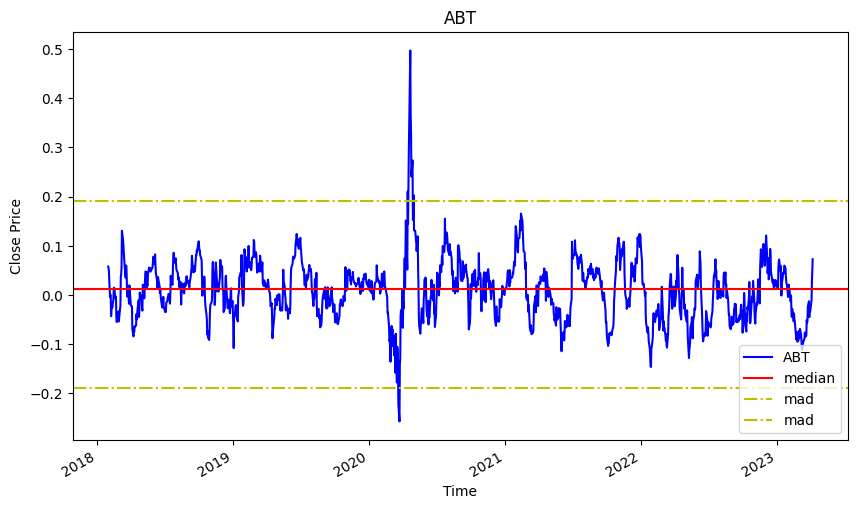

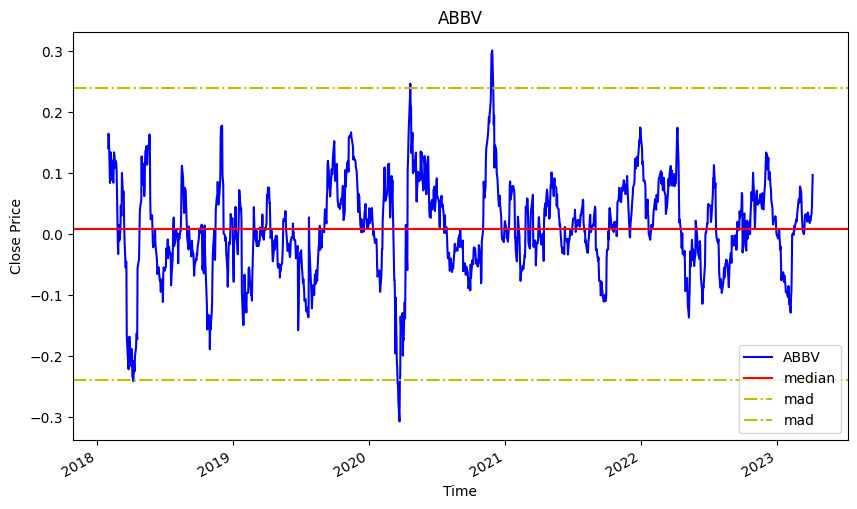

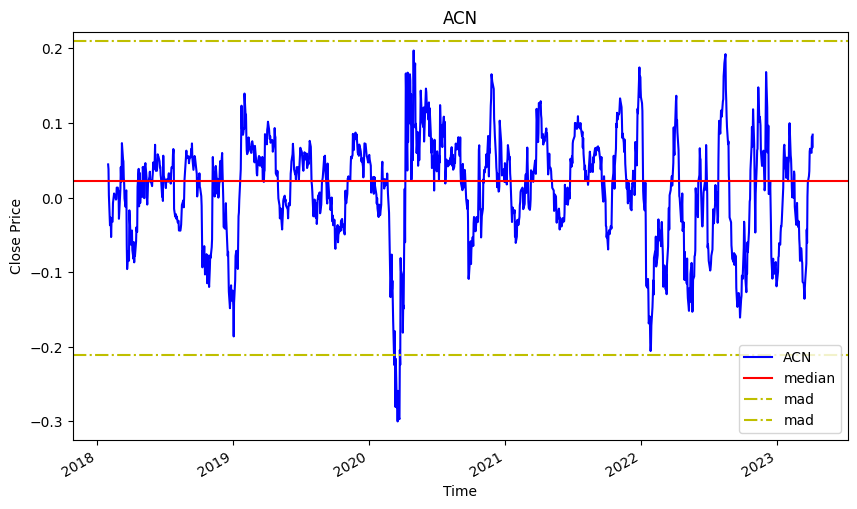

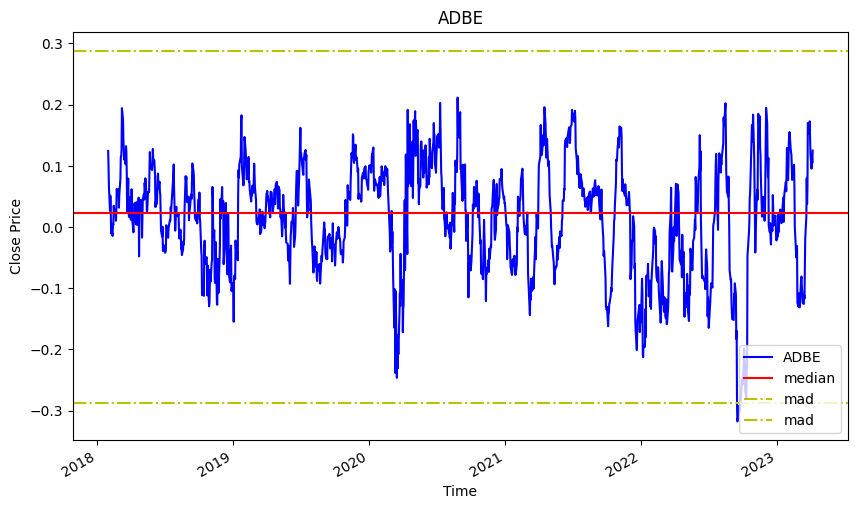

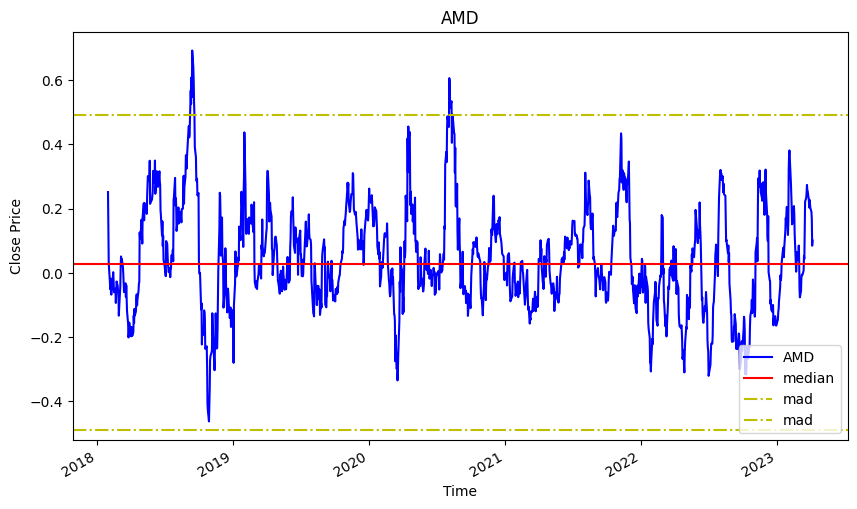

...

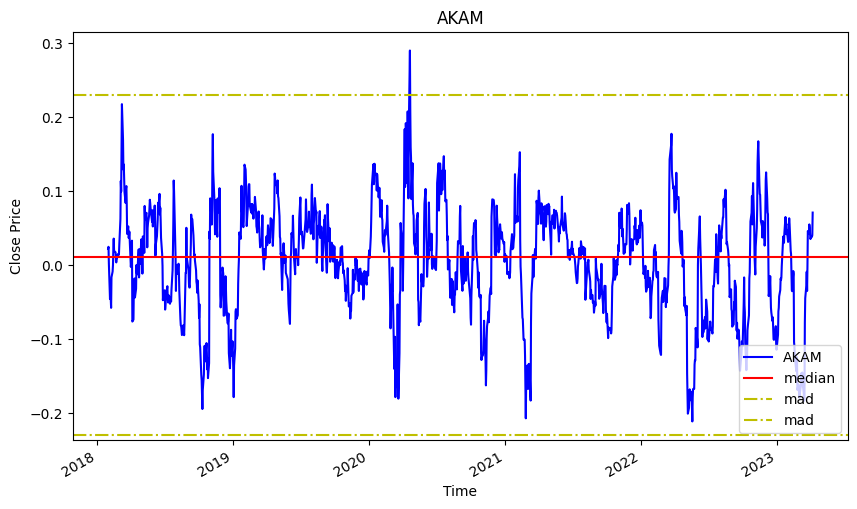

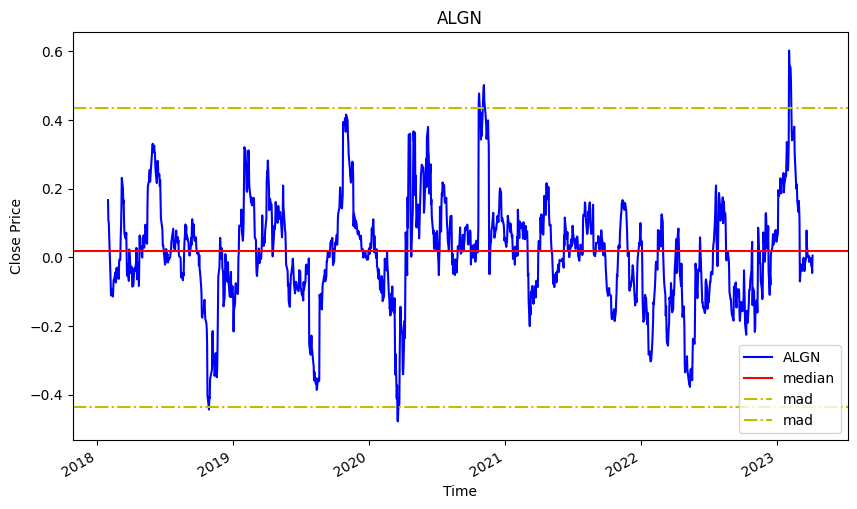

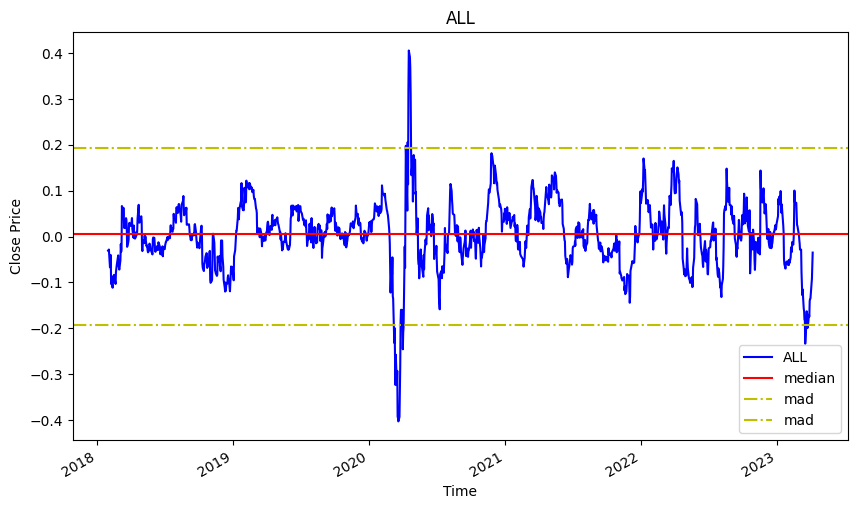

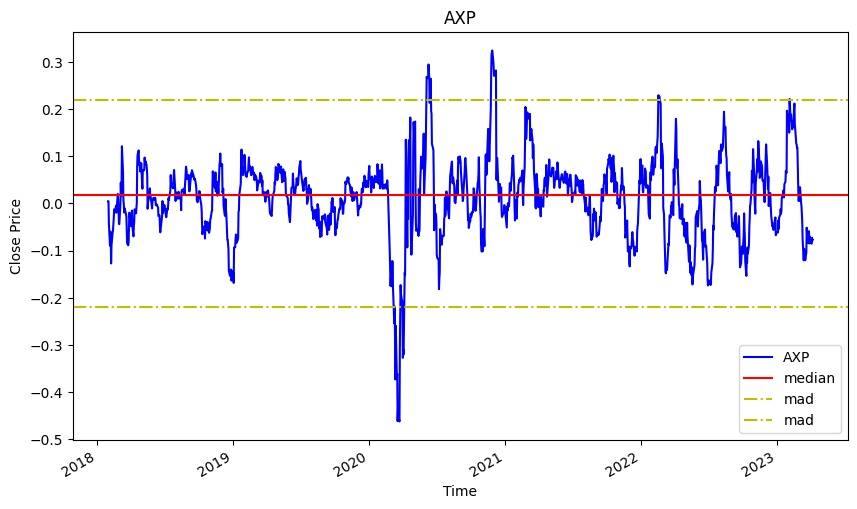

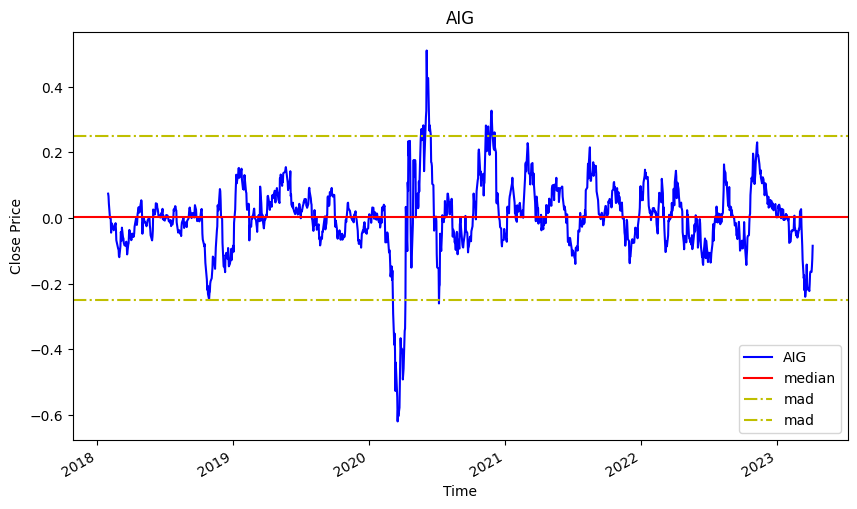

KeyboardInterrupt: ignored

In [ ]:
plot_med_mad(pct_changes_df,mediana_mad,'Close')

In [ ]:
pct_changes_df.shape

(1305, 1060)

In [ ]:
outliers = pd.DataFrame(index=pct_changes_df.index,
                  columns=pd.MultiIndex.from_product([pct_changes_df.columns.levels[0],
                                                      ['Open','High','Low','Close','Volume']]))

In [ ]:

def outliers_detection(df, price_cols, med_data, outliers):
    """
    Detect and modify outliers in a DataFrame containing stock price data.
    
    Args:
        df (pd.DataFrame): Input DataFrame containing stock price data.
        price_cols (list): List of column names in df that represent the price data.
        med_data (pd.DataFrame): DataFrame containing median values for each stock and price column.
        outliers (pd.DataFrame): DataFrame to store the modified values for the detected outliers.
        
    Returns:
        pd.DataFrame: DataFrame with modified values for the detected outliers.
    """
    for stock in df.columns.levels[0]:
        for col_type in price_cols:
            col = df.loc[:, (stock, col_type)]
            mcol = med_data.loc[:, (stock, col_type)]
            
            # Calculate median absolute deviation (MAD)
            mad = np.median(np.abs(col - mcol[0]))
            
            # Detect and modify outliers
            upper_threshold = mcol[0] + 5 * mad
            lower_threshold = mcol[0] - 5 * mad
            col = np.where(col > upper_threshold, upper_threshold, col)
            col = np.where(col < lower_threshold, lower_threshold, col)
            
            # Store modified values in outliers DataFrame
            outliers.loc[:, (stock, col_type)] = col
    
    return outliers


In [ ]:
outliers = outliers_detection(pct_changes_df,price_cols,mediana_mad,outliers)

<ipython-input-187-7b5a35dbfeba>:29: DeprecationWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  outliers.loc[:, (stock, col_type)] = col
<ipython-input-187-7b5a35dbfeba>:29: DeprecationWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  outliers.loc[:, (stock, col_type)] = col
<ipython-input-187-7b5a35dbfeba>:20: DeprecationWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, 

Splitting the data

In [ ]:
# Filter data for training, validation, and test sets
train_data_x = outliers.loc[(outliers.index >= '2018-01-31') & (outliers.index <= '2020-12-31')]
val_data_x = outliers.loc[(outliers.index >= '2021-01-01') & (outliers.index <= '2021-12-31')]
test_data_x = outliers.loc[(outliers.index >= '2022-01-01') & (outliers.index <= '2023-12-31')]

In [ ]:
print(train_data_x.shape,val_data_x.shape,test_data_x.shape)

(736, 1060) (252, 1060) (317, 1060)


In [ ]:
for i in outliers.columns.levels[0]:
  plt.figure(figsize=(14,4))
  plt.plot(train_data_x.loc[:, (i, 'Close')])
  plt.plot(val_data_x.loc[:, (i, 'Close')])
  plt.plot(test_data_x.loc[:, (i, 'Close')])
  plt.ylabel("Price")
  plt.xlabel("Date")
  plt.legend(["Training Set", "Validation Set","Test Set"])
  plt.title(i + " Closing Stock Price")
 

Scaling of dependent variables

In [ ]:
from sklearn.preprocessing import StandardScaler
# Scaling the training, validation, and test sets
transform_train_x = {}
transform_val_x = {}
transform_test_x = {}


scaler = {}

for i in outliers.columns.levels[0]:
    sc =StandardScaler()
    tr = np.array(train_data_x[i])
    vl = np.array(val_data_x[i])
    ts = np.array(test_data_x[i])
    tr0 = tr.reshape(tr.shape[0],5)
    vl0 = vl.reshape(vl.shape[0],5)
    ts0 = ts.reshape(ts.shape[0],5)
    transform_train_x[i] = sc.fit_transform(tr0)
    transform_val_x[i] = sc.transform(vl0)
    transform_test_x[i] = sc.transform(ts0)

 

    scaler[i] = sc
del tr
del vl
del ts

In [ ]:
trainset = {}
valset = {}
testset = {}
window_size = 1  # Updated window size

for j in outliers.columns.levels[0]:
    trainset[j] = {}
    X_train = []
    y_train = []
    for i in range(window_size, 736):
        X_train.append(transform_train_x[j][i-window_size:i])
        y_train.append(transform_train_x[j][i][3])  # Update indexing for train_y
    X_train, y_train = np.array(X_train), np.array(y_train)
    trainset[j]["X"] = np.reshape(X_train, (X_train.shape[0], window_size, 5))
    trainset[j]["y"] = y_train

    valset[j] = {}
    X_val = []
    y_val = []
    for i in range(window_size, 252):  
        X_val.append(transform_val_x[j][i-window_size:i])
        y_val.append(transform_val_x[j][i][3])  # Update indexing for val_y
    X_val, y_val = np.array(X_val), np.array(y_val)
    valset[j]["X"] = np.reshape(X_val, (X_val.shape[0], window_size, 5))
    valset[j]["y"] = y_val

    testset[j] = {}
    X_test = []
    y_test = []
    for i in range(window_size, 317):  
        X_test.append(transform_test_x[j][i-window_size:i])
        y_test.append(transform_test_x[j][i][3])
    X_test, y_test = np.array(X_test), np.array(y_test)
    testset[j]["X"] = np.reshape(X_test, (X_test.shape[0], window_size, 5))
    testset[j]["y"] = y_test

In [ ]:
arr_buff = []
for i in outliers.columns.levels[0]:
    buff = {}
    buff["X_train"] = trainset[i]["X"].shape
    buff["y_train"] = trainset[i]["y"].shape
    buff["X_val"] = valset[i]["X"].shape
    buff["y_val"] = valset[i]["y"].shape
    buff["X_test"] = testset[i]["X"].shape
    buff["y_test"] = testset[i]["y"].shape
    arr_buff.append(buff)

pd.DataFrame(arr_buff, index=outliers.columns.levels[0])

,X_train,y_train,X_val,y_val,X_test,y_test
Ticker,,,,,,
A,"(735, 1, 5)","(735,)","(251, 1, 5)","(251,)","(316, 1, 5)","(316,)"
AAPL,"(735, 1, 5)","(735,)","(251, 1, 5)","(251,)","(316, 1, 5)","(316,)"
ABBV,"(735, 1, 5)","(735,)","(251, 1, 5)","(251,)","(316, 1, 5)","(316,)"
ABC,"(735, 1, 5)","(735,)","(251, 1, 5)","(251,)","(316, 1, 5)","(316,)"
ABT,"(735, 1, 5)","(735,)","(251, 1, 5)","(251,)","(316, 1, 5)","(316,)"
...,...,...,...,...,...,...
XRAY,"(735, 1, 5)","(735,)","(251, 1, 5)","(251,)","(316, 1, 5)","(316,)"
ZBH,"(735, 1, 5)","(735,)","(251, 1, 5)","(251,)","(316, 1, 5)","(316,)"
ZBRA,"(735, 1, 5)","(735,)","(251, 1, 5)","(251,)","(316, 1, 5)","(316,)"


In [ ]:
trainset[i]["X"].shape

(736, 1, 5)

In [ ]:
jupyter nbconvert --to notebook --no-input --no-prompt --template notebook --output preproccesing.ipynb --start 1 --end 10 my_notebook.ipynb


## LSTM 

In [ ]:
from keras.models import Sequential
from keras.layers import LSTM, Dense, Dropout
from keras.optimizers import RMSprop
from keras.callbacks import EarlyStopping
from keras.optimizers import Adam
import tensorflow as tf
import keras

In [ ]:
# Define hyperparameters
hidden_nodes = 5
hidden_layers = 1
learning_rate = 0.001
patient = 0
batch_size = 64
dropout_rate = 0.1
recurrent_dropout_rate = 0.2
optimizer = RMSprop()

# Build LSTM model
lstm = Sequential()
lstm.add(LSTM(hidden_nodes, input_shape=(trainset[i]["X"].shape[1], trainset[i]["X"].shape[2])))
lstm.add(Dropout(dropout_rate))
for _ in range(hidden_layers-1):
    lstm.add(LSTM(hidden_nodes))
    lstm.add(Dropout(dropout_rate))
lstm.add(Dense(1, activation='linear'))  # Change activation function to 'linear'
lstm.compile(loss='mean_squared_error', optimizer=optimizer)


# Train the model with early stopping for each dataset
histories = {}
for i in outliers.columns.levels[0]:
    print("Fitting to", i)
    early_stopping = keras.callbacks.EarlyStopping(monitor='val_loss', patience=patient)
    history = lstm.fit(trainset[i]["X"], trainset[i]["y"], batch_size=batch_size, epochs=100, validation_data = (valset[i]["X"], valset[i]["y"]), callbacks=[early_stopping], verbose=1)
    histories[i] = history


Fitting to A
Epoch 1/100
12/12 [==============================] - 6s 114ms/step - loss: 0.8139 - val_loss: 0.6866
Epoch 2/100
12/12 [==============================] - 0s 7ms/step - loss: 0.7678 - val_loss: 0.6530
Epoch 3/100
12/12 [==============================] - 0s 7ms/step - loss: 0.7286 - val_loss: 0.6235
Epoch 4/100
12/12 [==============================] - 0s 6ms/step - loss: 0.6908 - val_loss: 0.5957
Epoch 5/100
12/12 [==============================] - 0s 13ms/step - loss: 0.6737 - val_loss: 0.5691
Epoch 6/100
12/12 [==============================] - 0s 10ms/step - loss: 0.6298 - val_loss: 0.5437
Epoch 7/100
12/12 [==============================] - 0s 13ms/step - loss: 0.5916 - val_loss: 0.5198
Epoch 8/100
12/12 [==============================] - 0s 23ms/step - loss: 0.5619 - val_loss: 0.4969
Epoch 9/100
12/12 [==============================] - 0s 10ms/step - loss: 0.5592 - val_loss: 0.4757
Epoch 10/100
12/12 [==============================] - 0s 10ms/step - loss: 0.5309 - val_l

In [ ]:
# Create a dictionary to store average returns for each stock using a dictionary comprehension
returns = {i: lstm.predict(testset[i]["X"], batch_size=batch_size) for i in outliers.columns.levels[0]}

5/5 [==============================] - 3s 857ms/step


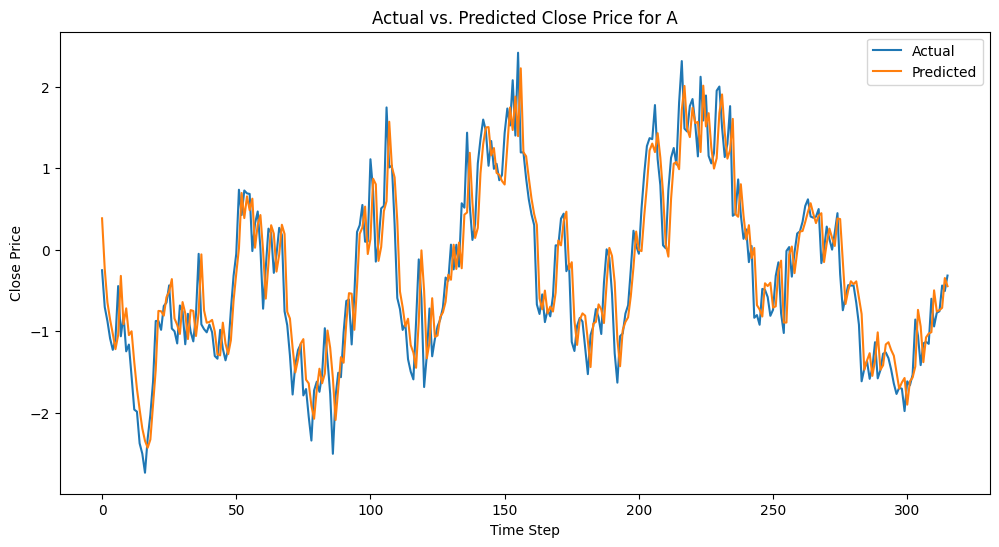

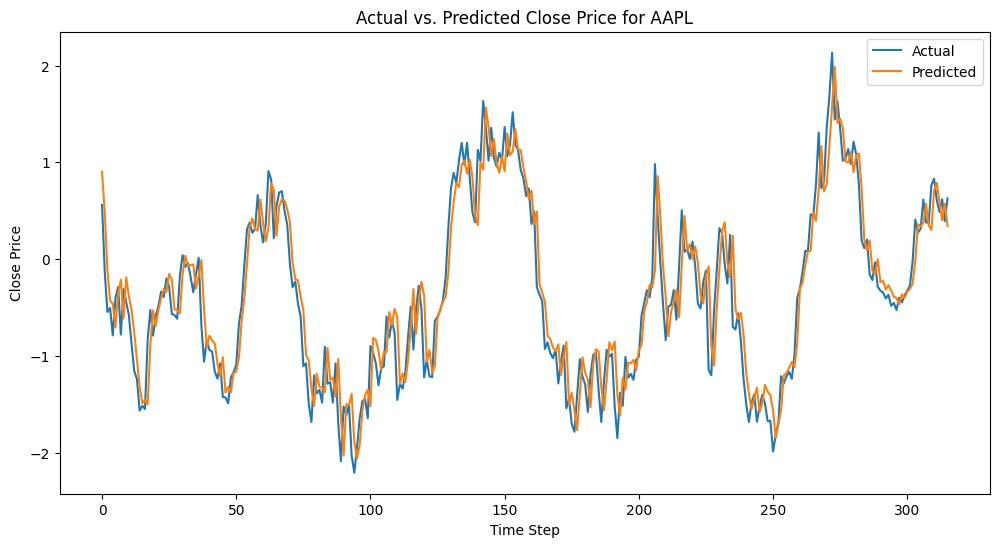

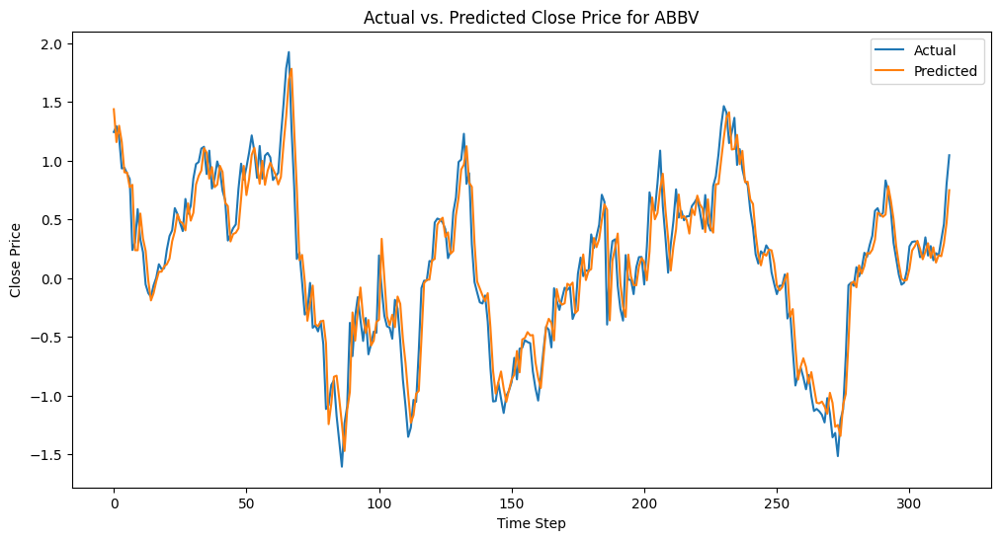

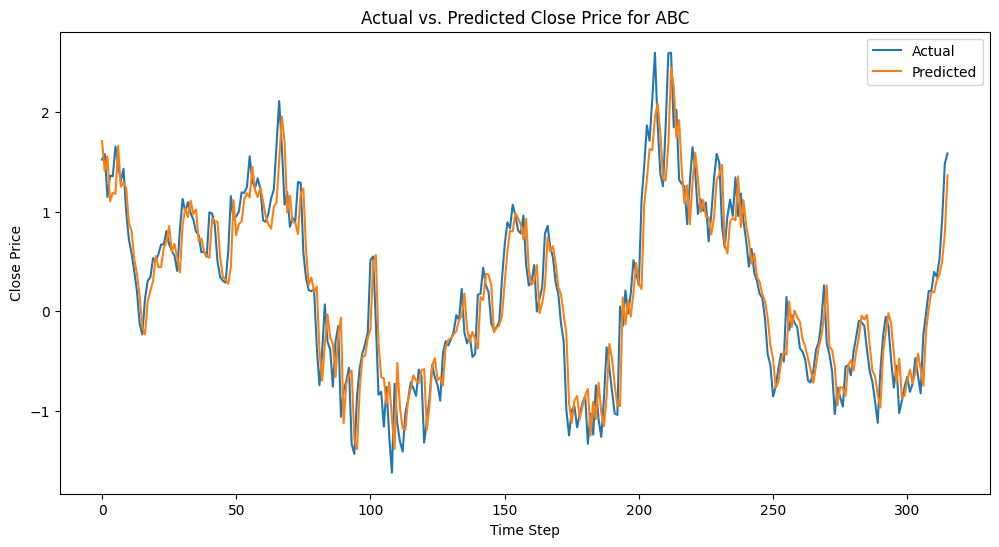

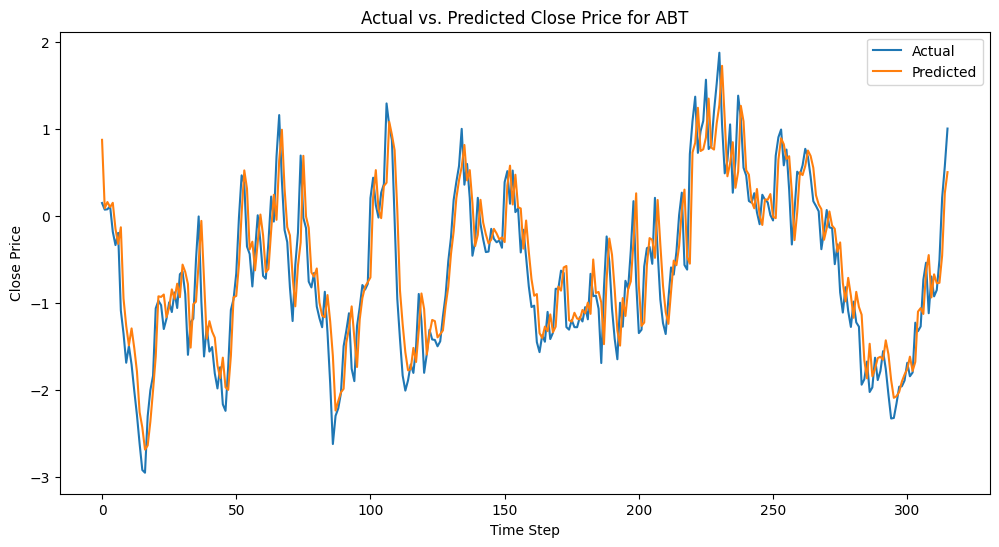

...

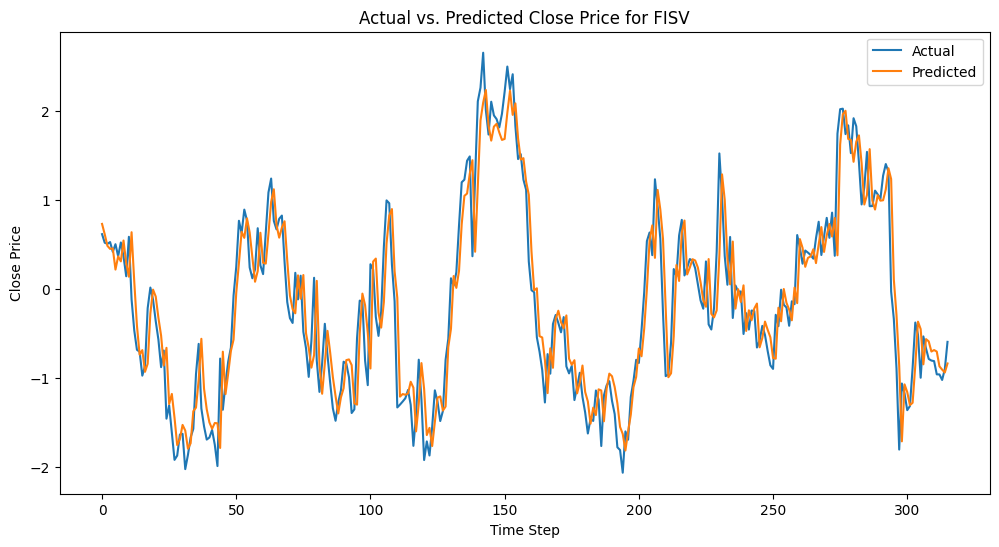

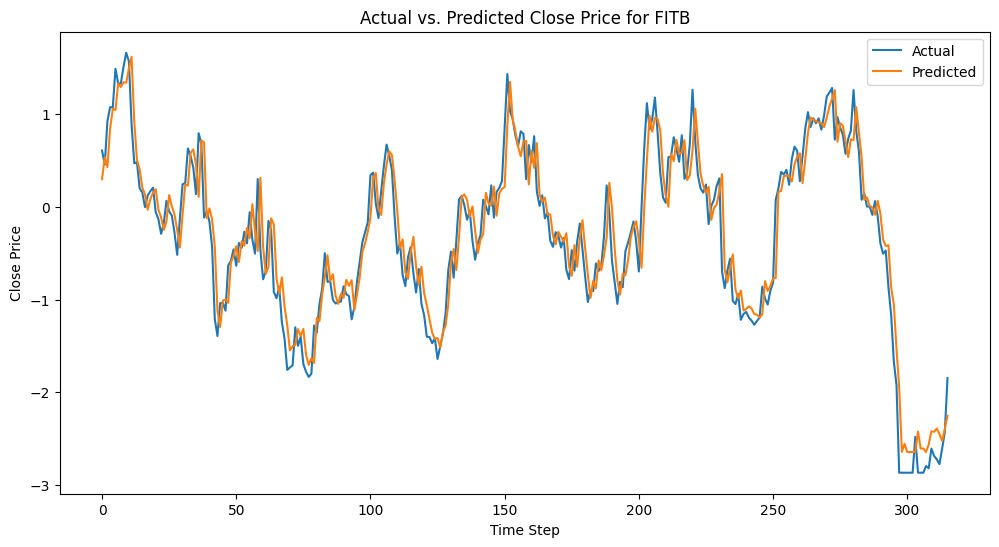

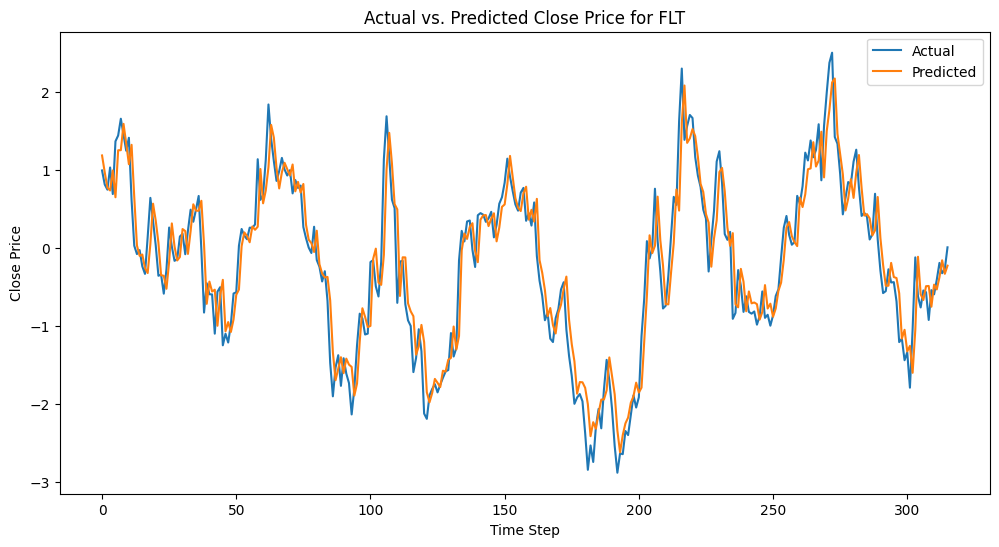

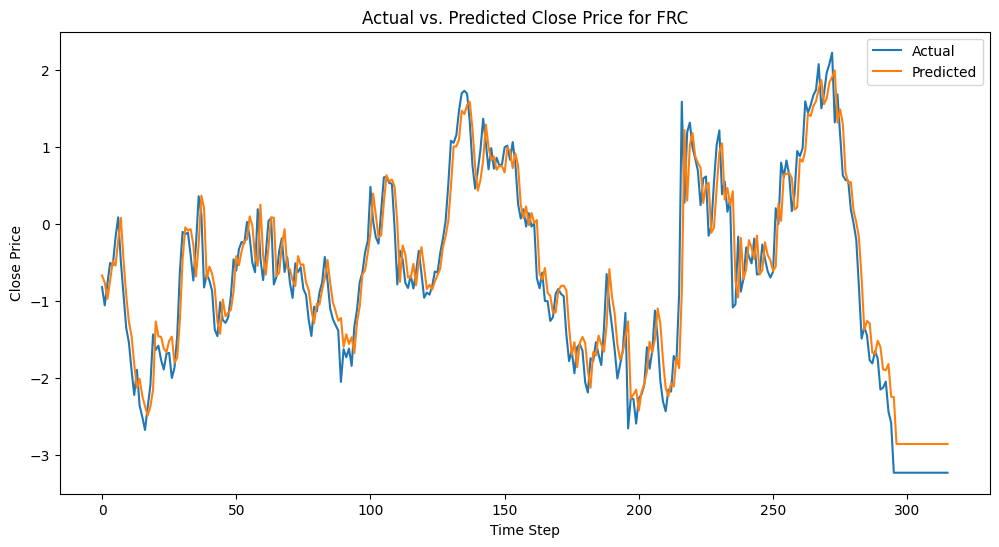

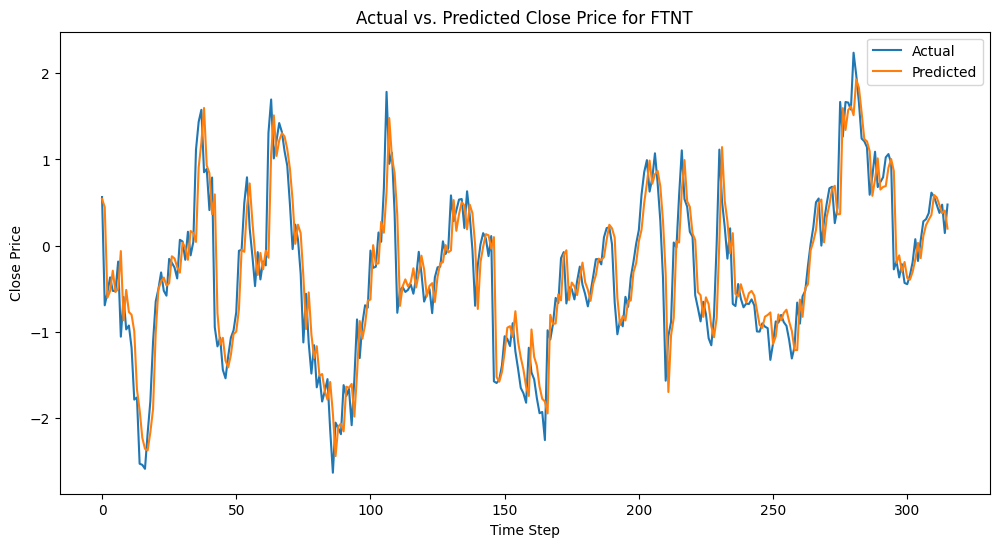

KeyboardInterrupt: ignored

In [ ]:
# Plot predicted results
for i in outliers.columns.levels[0]:
    # Plot actual vs. predicted values
    plt.figure(figsize=(12, 6))
    plt.plot(testset[i]["y"], label='Actual')
    plt.plot(returns[i], label='Predicted')
    plt.title('Actual vs. Predicted Close Price for ' + i)
    plt.xlabel('Time Step')
    plt.ylabel('Close Price')
    plt.legend()
    plt.show()

## **CNN**

In [ ]:
from keras.layers import Conv1D, MaxPooling1D, Flatten, Dense
from keras.optimizers import SGD

In [ ]:
# Define CNN model
# Define CNN model
model = Sequential()
model.add(Conv1D(filters=32, kernel_size=1, activation='relu', input_shape=(1, 5)))
model.add(MaxPooling1D(pool_size=1))
model.add(Flatten())
model.add(Dense(64, activation='relu'))
model.add(Dense(1))

# Compile model
model.compile(optimizer='adam', loss='mse')


# Train the model with early stopping for each dataset
histories_cnn = {}
for i in outliers.columns.levels[0]:
    print("Fitting to", i)
    early_stopping = EarlyStopping(monitor='val_loss', patience=10)
    history_cnn = model.fit(trainset[i]["X"], trainset[i]["y"], validation_data=(valset[i]["X"], valset[i]["y"]), epochs=100, batch_size=batch_size, callbacks=[early_stopping])
    histories_cnn[i] = history_cnn

Streaming output truncated to the last 5000 lines.
12/12 [==============================] - 0s 8ms/step - loss: 0.0840 - val_loss: 0.0649
Epoch 10/100
12/12 [==============================] - 0s 8ms/step - loss: 0.0833 - val_loss: 0.0654
Epoch 11/100
12/12 [==============================] - 0s 7ms/step - loss: 0.0829 - val_loss: 0.0650
Fitting to DXCM
Epoch 1/100
12/12 [==============================] - 0s 10ms/step - loss: 0.0925 - val_loss: 0.0612
Epoch 2/100
12/12 [==============================] - 0s 7ms/step - loss: 0.0908 - val_loss: 0.0638
Epoch 3/100
12/12 [==============================] - 0s 8ms/step - loss: 0.0899 - val_loss: 0.0609
Epoch 4/100
12/12 [==============================] - 0s 6ms/step - loss: 0.0895 - val_loss: 0.0616
Epoch 5/100
12/12 [==============================] - 0s 7ms/step - loss: 0.0887 - val_loss: 0.0616
Epoch 6/100
12/12 [==============================] - 0s 7ms/step - loss: 0.0883 - val_loss: 0.0627
Epoch 7/100
12/12 [==============================] 

In [ ]:
returns_cnn = {}
# Loop through stocks
for i in outliers.columns.levels[0]:
    # Get predicted values
    y_pred_test_cnn = model.predict(testset[i]["X"], batch_size=batch_size)
    

    returns_cnn[i] = y_pred_test_cnn

5/5 [==============================] - 0s 3ms/step


In [ ]:
# Plot predicted results
for i in outliers.columns.levels[0]:
    # Get predicted values


    
    
    # Plot actual vs. predicted values
    plt.figure(figsize=(12, 6))
    plt.plot(testset[i]["y"], label='Actual')
    plt.plot(returns_cnn[i], label='Predicted')
    plt.title('Actual vs. Predicted Close Price for ' + i)
    plt.xlabel('Time Step')
    plt.ylabel('Close Price')
    plt.legend()
    plt.show()

In [ ]:
returns[i].shape

# Random Forest

In [ ]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.model_selection import train_test_split

In [ ]:
# Create a Random Forest regressor model
rf_regressor = RandomForestRegressor(n_estimators=100, random_state=42)
histories_rf = {}
for i in outliers.columns.levels[0]:
    # Fit the model to the training data
    history_rf=rf_regressor.fit(trainset[i]["X"].reshape(-1, 5), trainset[i]["y"])
    histories_rf[i]=history_rf

# Predict the return for the test data
#y_pred = rf_regressor.predict(X_test)

In [ ]:
# Predict the return for the test data

returns_rf = {}
# Loop through stocks
for i in outliers.columns.levels[0]:
    # Get predicted values
    y_pred_test_rf = rf_regressor.predict(testset[i]["X"].reshape(-1, 5))
    

    returns_rf[i] = y_pred_test_rf

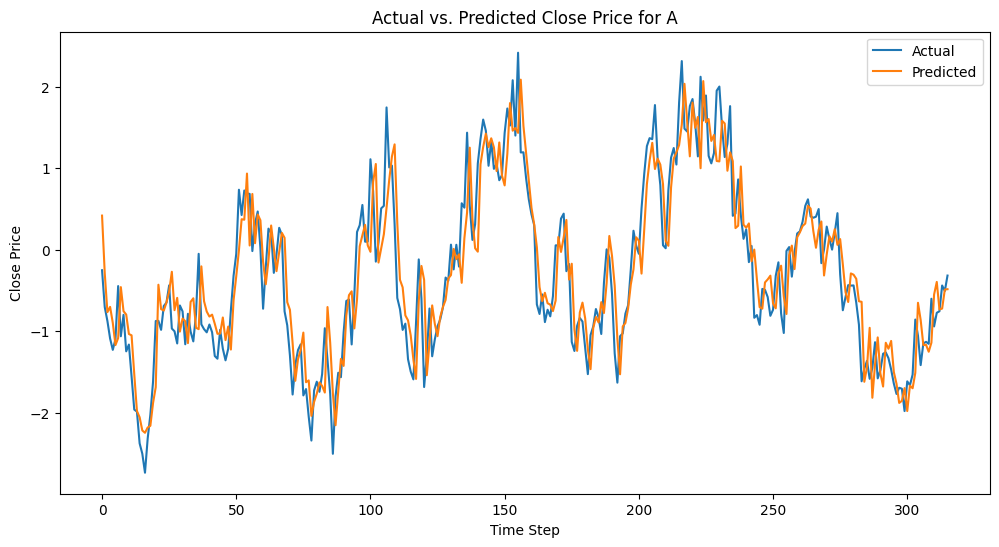

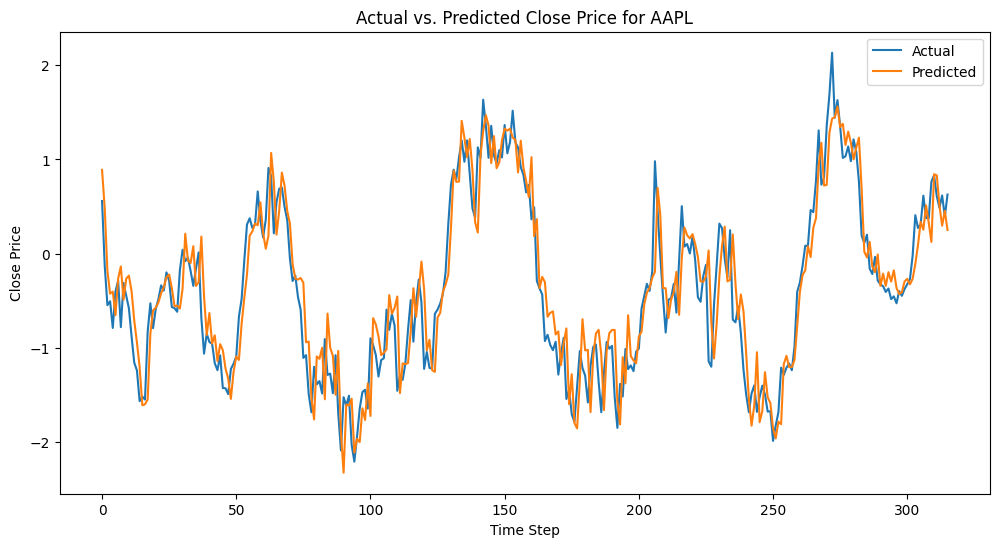

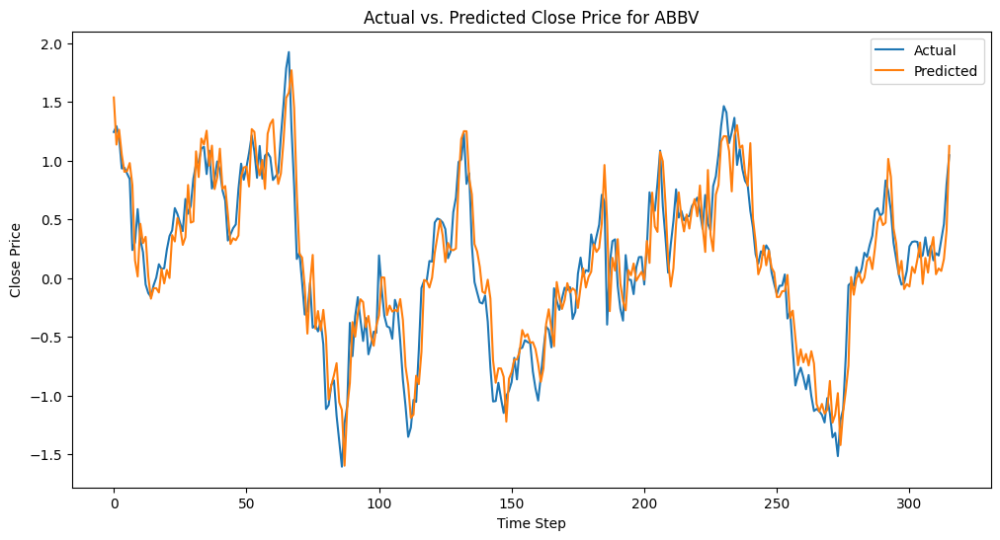

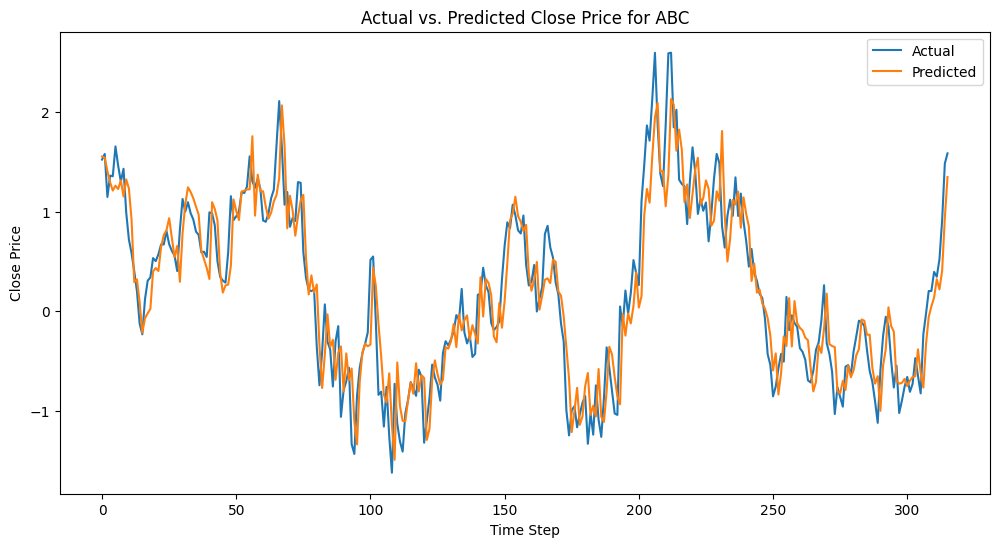

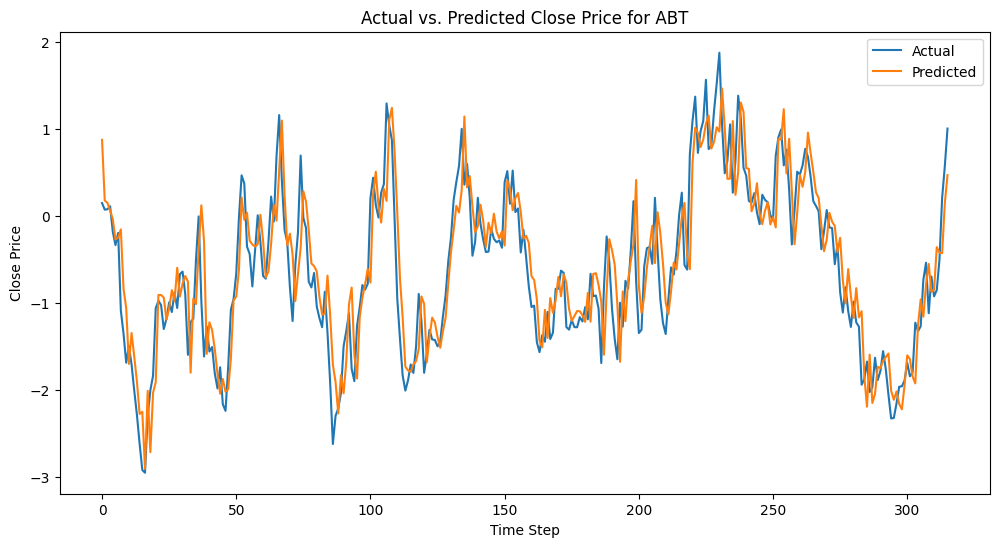

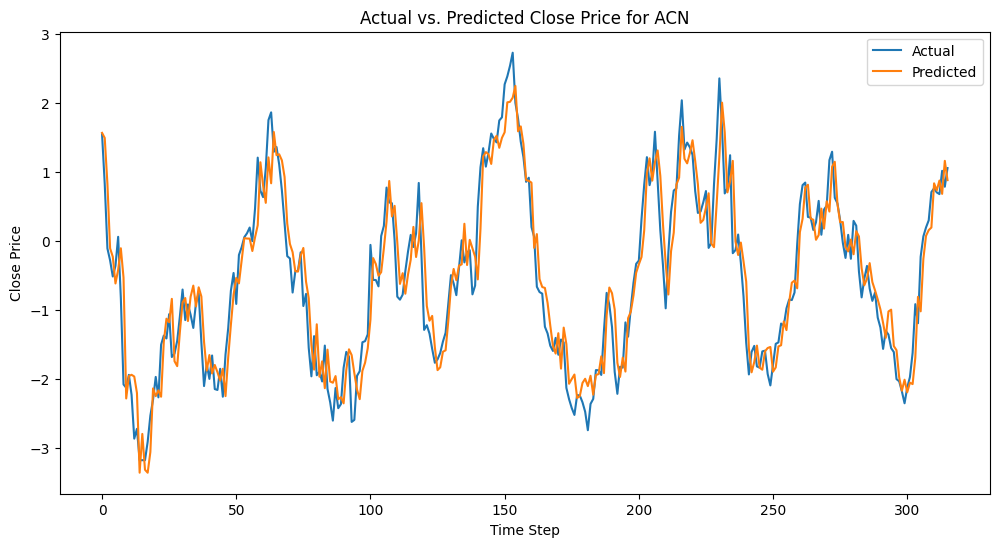

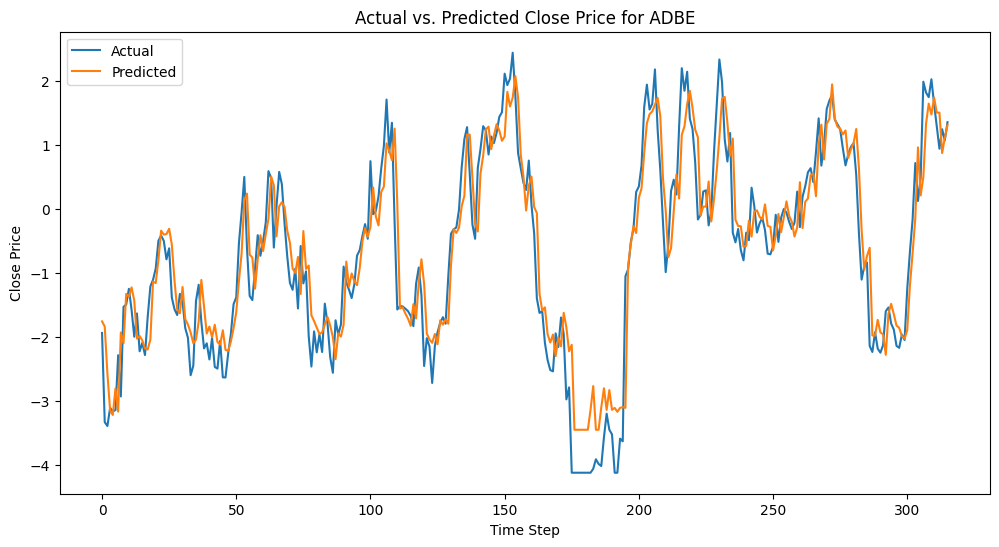

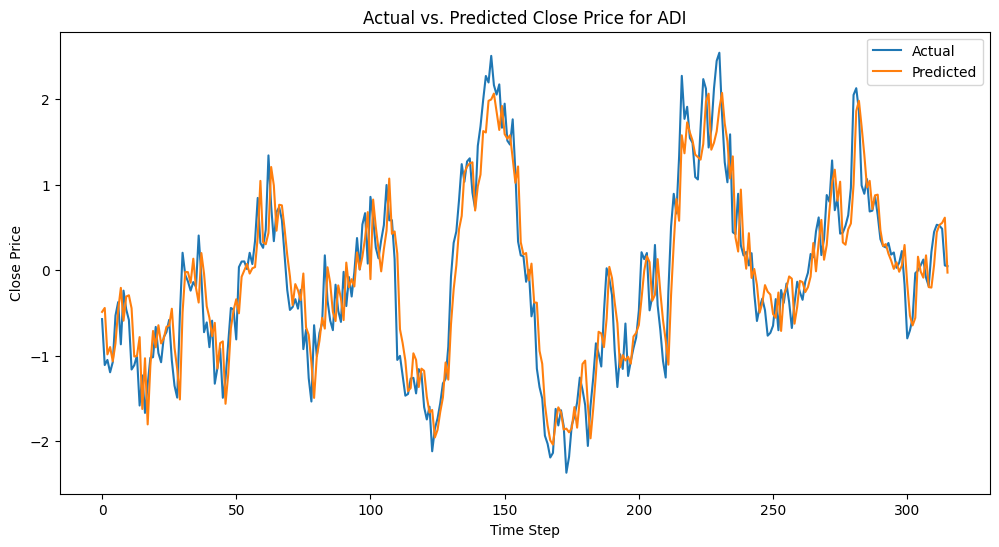

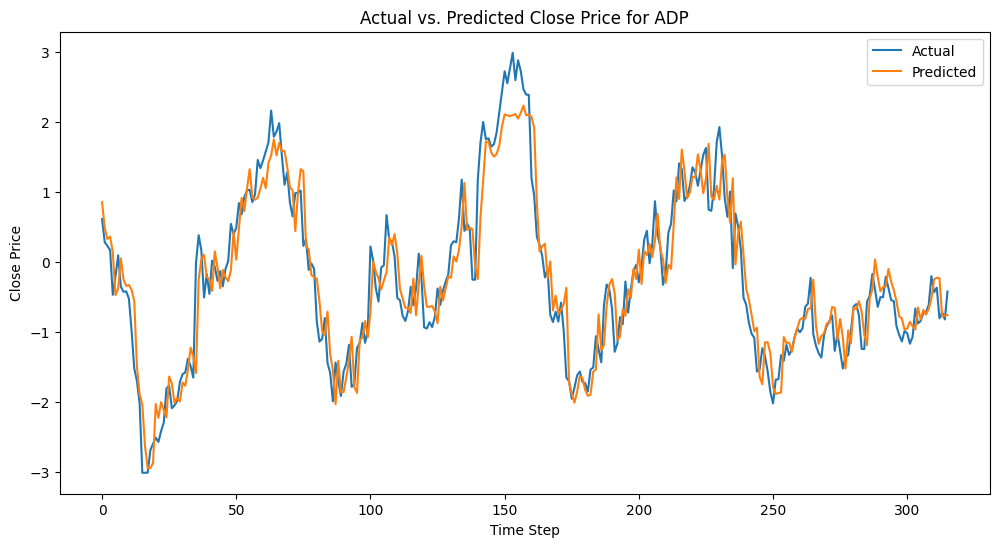

KeyboardInterrupt: ignored

In [ ]:
# Plot predicted results
for i in outliers.columns.levels[0]:
    # Get predicted values


    
    
    # Plot actual vs. predicted values
    plt.figure(figsize=(12, 6))
    plt.plot(testset[i]["y"], label='Actual')
    plt.plot(returns_rf[i], label='Predicted')
    plt.title('Actual vs. Predicted Close Price for ' + i)
    plt.xlabel('Time Step')
    plt.ylabel('Close Price')
    plt.legend()
    plt.show()

#Linear Regression

In [ ]:
from sklearn.linear_model import LinearRegression

In [ ]:
# Create a Linear Regression model
lr_model = LinearRegression()

In [ ]:
# Create a Random Forest regressor model
histories_lr = {}
for i in outliers.columns.levels[0]:

    # Fit the model to the training data
    history_lr=lr_model.fit(trainset[i]["X"].reshape(-1, 5), trainset[i]["y"])
    histories_lr[i]=history_lr

In [ ]:
# Predict the return for the test data

returns_lr = {}
# Loop through stocks
for i in outliers.columns.levels[0]:
    # Get predicted values
    y_pred_test_lr = lr_model.predict(testset[i]["X"].reshape(-1, 5))
    

    returns_lr[i] = y_pred_test_lr

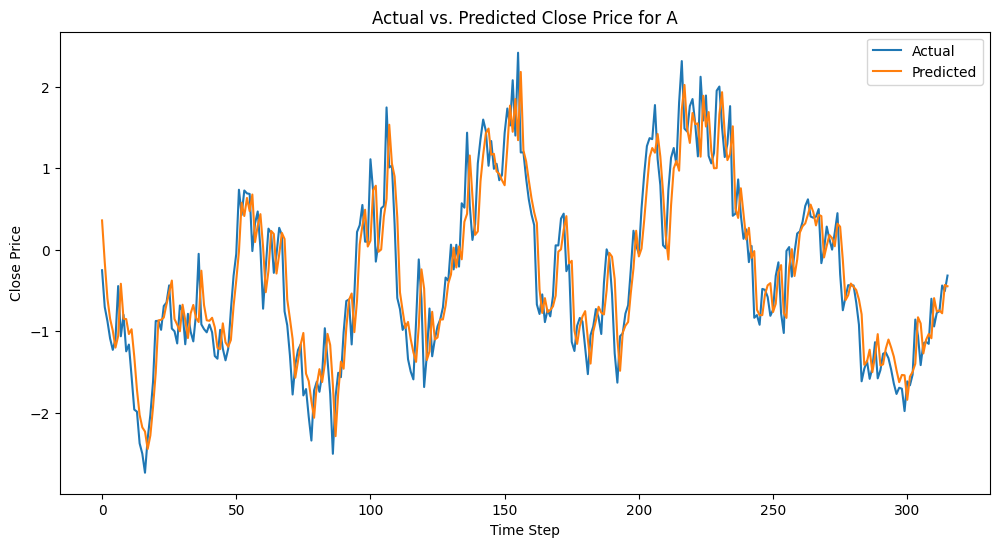

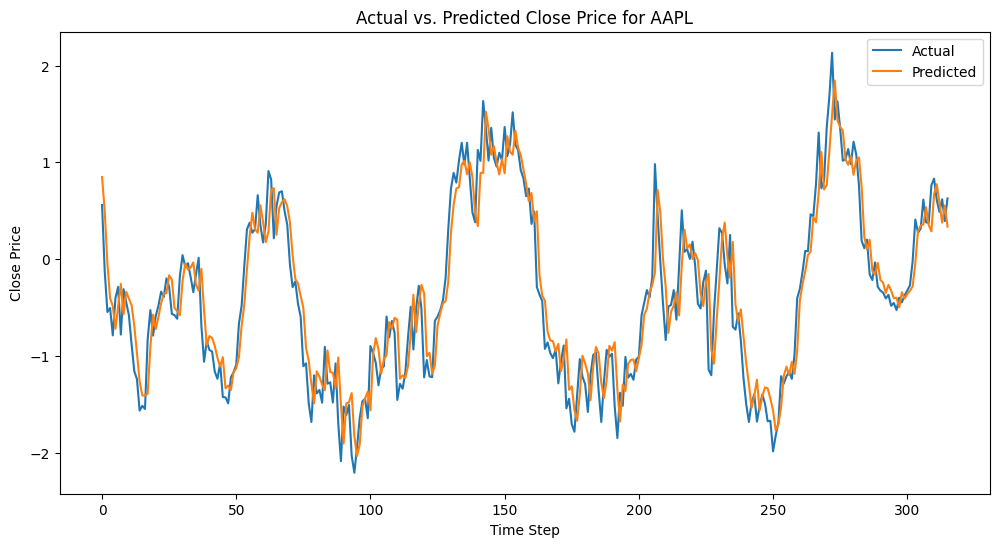

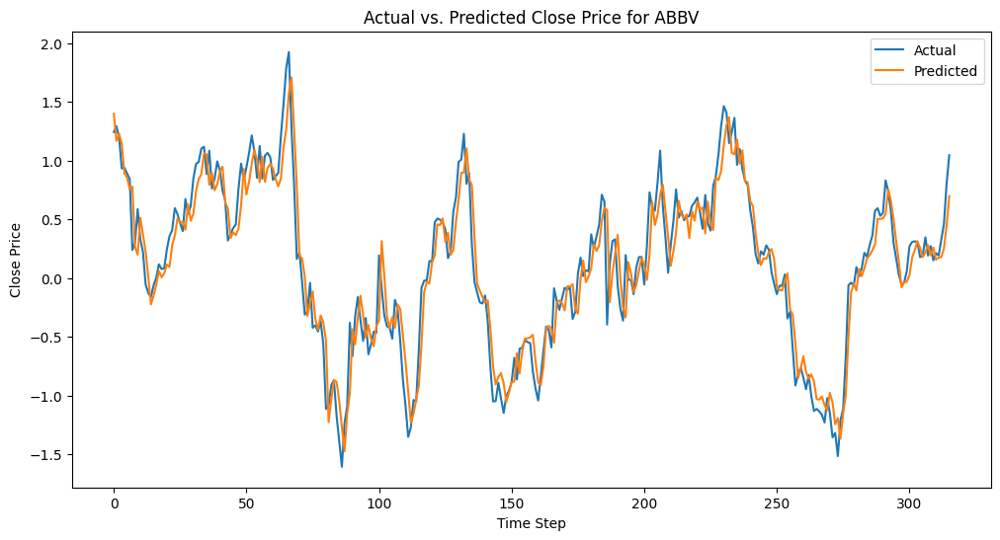

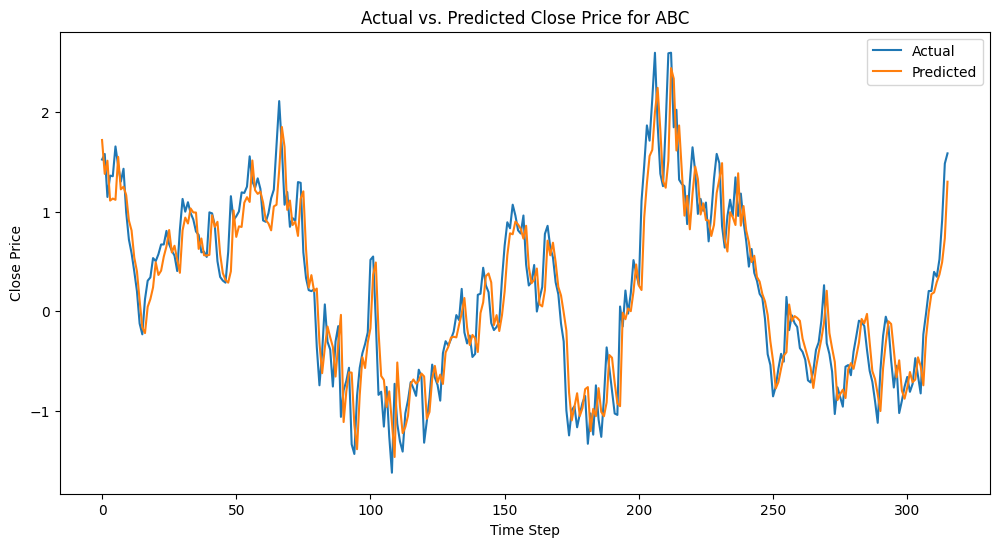

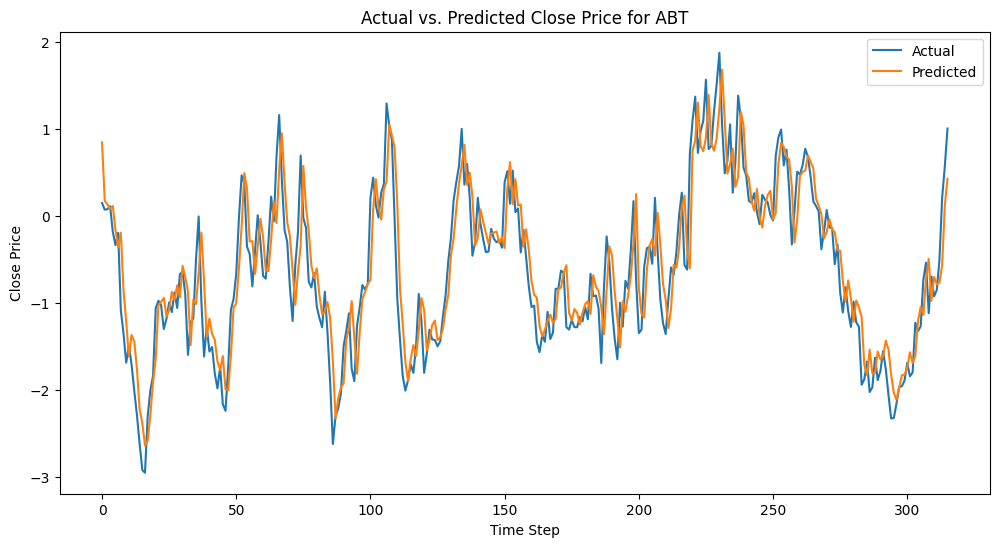

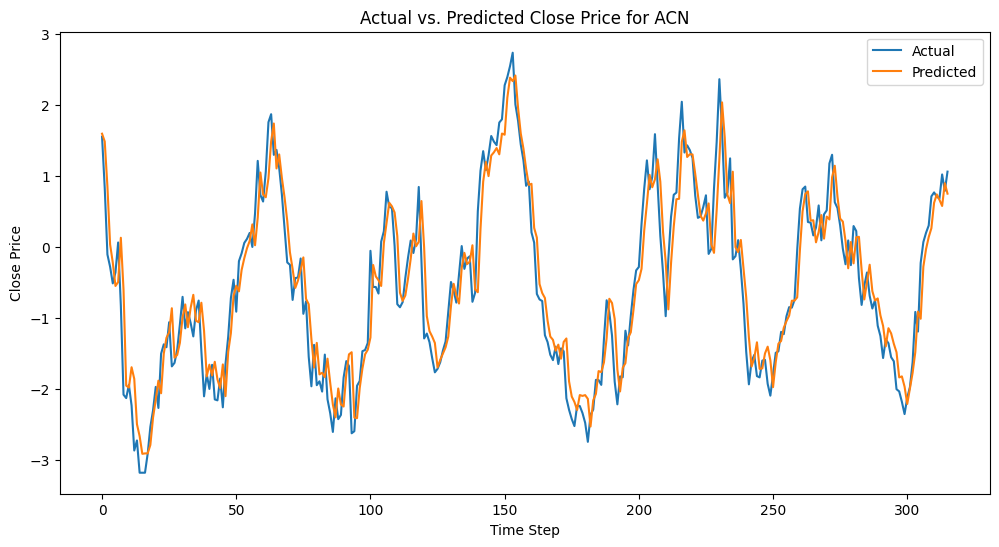

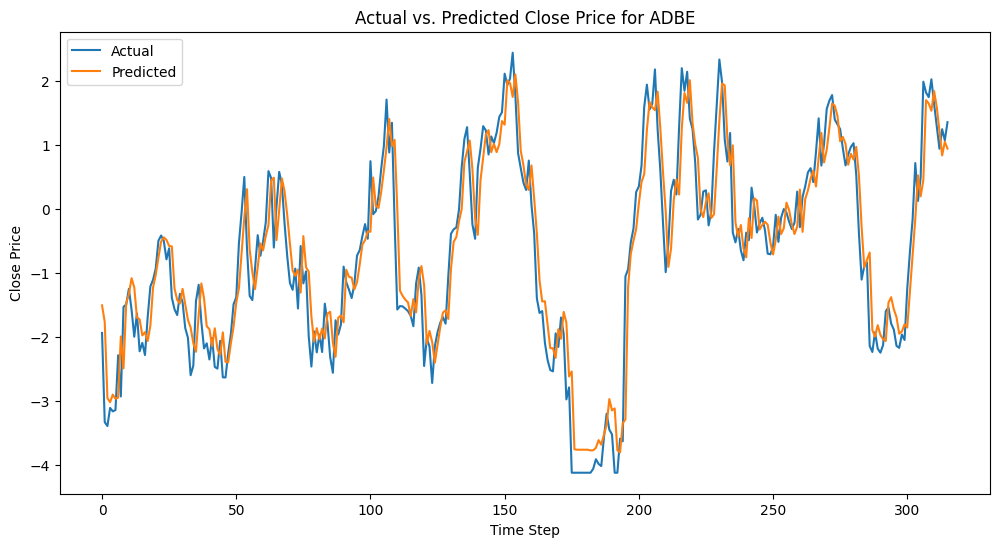

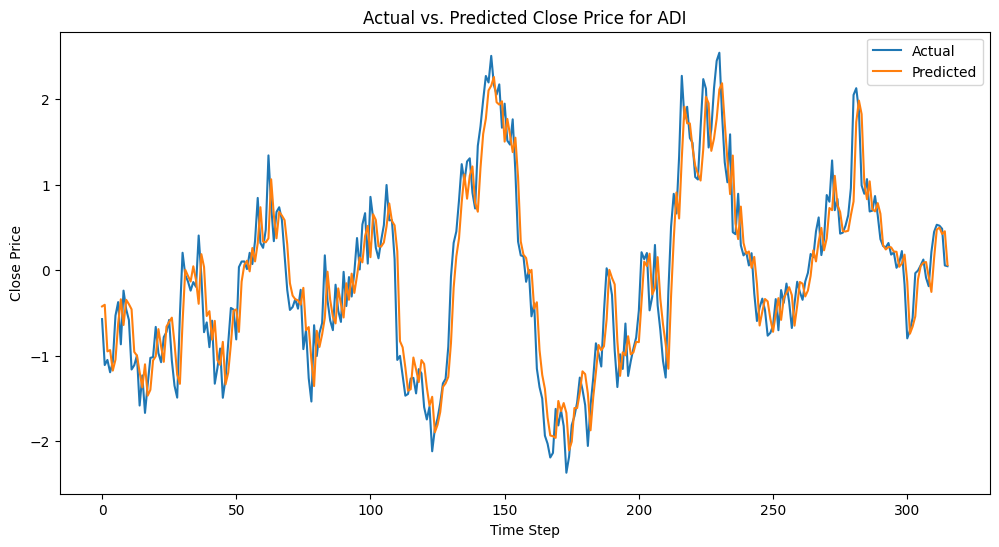

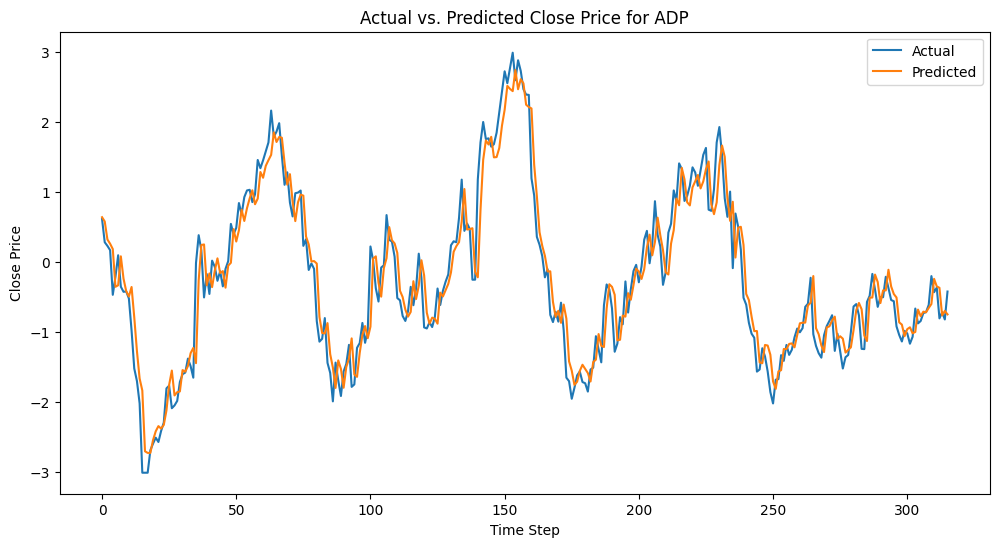

KeyboardInterrupt: ignored

In [ ]:
# Plot predicted results
for i in outliers.columns.levels[0]:
    # Get predicted values


    
    
    # Plot actual vs. predicted values
    plt.figure(figsize=(12, 6))
    plt.plot(testset[i]["y"], label='Actual')
    plt.plot(returns_lr[i], label='Predicted')
    plt.title('Actual vs. Predicted Close Price for ' + i)
    plt.xlabel('Time Step')
    plt.ylabel('Close Price')
    plt.legend()
    plt.show()

#Evaluation

In [ ]:
from sklearn.metrics import confusion_matrix

In [ ]:
testset[i]["y"]

In [ ]:
from sklearn.metrics import r2_score

In [ ]:
# Evaluate the model on test data
lstm_mse = {}
cnn_mse = {}
rf_mse = {}
lr_mse = {}

r2_lstm={}
r2_cnn ={}
r2_rf = {}
r2_lr = {}
for i in outliers.columns.levels[0]:
    lstm_mse[i] = lstm.evaluate(testset[i]["X"], testset[i]["y"], batch_size=batch_size)
    cnn_mse[i] = model.evaluate(testset[i]["X"], testset[i]["y"], batch_size=batch_size)
    rf_mse[i] = mean_squared_error(testset[i]["y"],returns_rf[i])
    lr_mse[i] = mean_squared_error(testset[i]["y"],returns_lr[i])
    r2_lstm[i] = r2_score(testset[i]['y'], returns[i])
    r2_cnn[i] = r2_score(testset[i]['y'], returns_cnn[i])
    r2_rf[i] = r2_score(testset[i]['y'], returns_rf[i])
    r2_lr[i] = r2_score(testset[i]['y'], returns_lr[i])


5/5 [==============================] - 0s 4ms/step - loss: 0.2132


In [ ]:
# Convert the dictionaries to dataframes
mse_df = pd.DataFrame(list(lstm_mse.items()), columns=['Stock', 'LSTM'])
mse_df['CNN'] = list(cnn_mse.values())
mse_df['RF'] = list(rf_mse.values())
mse_df['LR'] = list(lr_mse.values())
r2_df = pd.DataFrame(list(r2_lstm.items()), columns=['Stock', 'LSTM'])
r2_df['CNN'] = list(r2_cnn.values())
r2_df['RF'] = list(r2_rf.values())
r2_df['LR'] = list(r2_lr.values())

In [ ]:
mean_models = {}
std_models = {}
mean_r2 = {}
std_r2 = {}
for i in ['LSTM',	'CNN',	'RF',	'LR']:
  mean_models[i] = np.mean(mse_df[i])
  std_models[i] = np.std(mse_df[i])
  mean_r2[i] = np.mean(r2_df[i])
  std_r2[i] = np.std(r2_df[i])

In [ ]:
# Define columns MultiIndex
columns = pd.MultiIndex.from_product([['Mean', 'Std'], ['MSE', 'R2']], 
                                     names=['Metric', 'Score'])

# Create DataFrame with the columns MultiIndex and the mean/std values
results_df = pd.DataFrame(index=mean_models.keys(), columns=columns)
for i in mean_models.keys():
    results_df.loc[i, ('Mean', 'MSE')] = mean_models[i]
    results_df.loc[i, ('Mean', 'R2')] = mean_r2[i]
    results_df.loc[i, ('Std', 'MSE')] = std_models[i]
    results_df.loc[i, ('Std', 'R2')] = std_r2[i]
    
# Reset index name
results_df.index.name = 'Model'

In [ ]:
results_df

Metric      Mean                 Std          
Score        MSE        R2       MSE        R2
Model                                         
LSTM     0.12736  0.880719  0.054511  0.027696
CNN     0.130962    0.8767  0.054733  0.029555
RF       0.15002  0.857822  0.058349    0.0311
LR      0.129761   0.87765  0.051735  0.027885

In [ ]:
# Create an empty DataFrame to store average returns
av_ret = pd.DataFrame(columns=["Symbol","Average_Return"])

# Iterate over the stocks
for i in outliers.columns.levels[0]:
    # Calculate the average return for the current stock
    avg_return = np.mean(returns[i][-30:])
    # Create a temporary DataFrame with stock symbol and average return
    temp_df = pd.DataFrame({'Symbol': [i], 'Average_Return': [avg_return]})
    # Concatenate the temporary DataFrame to the main DataFrame
    av_ret = pd.concat([av_ret, temp_df], ignore_index=True)

# Sort the stocks based on average return in descending order
av_ret = av_ret.sort_values(by="Average_Return", ascending=False)

# Filter the DataFrame to keep only stocks with average returns greater than 0
positive_av_ret = av_ret[av_ret['Average_Return'] > 0]

# Merge the tables on "Symbol" column
merged_table = pd.merge(positive_av_ret, sp500, on='Symbol')




In [ ]:
merged_table.head(20)

,Symbol,Average_Return,Name,Sector
0,WST,1.093681,West Pharmaceutical Services,Health Care
1,ANET,1.064967,Arista Networks,Information Technology
2,ANSS,1.024878,Ansys,Information Technology
3,NVDA,0.903886,Nvidia,Information Technology
4,CRM,0.617188,Salesforce,Information Technology
5,JNPR,0.353130,Juniper Networks,Information Technology
6,INTC,0.326263,Intel,Information Technology
7,FTNT,0.322509,Fortinet,Information Technology
8,ABBV,0.311089,AbbVie,Health Care
9,MSFT,0.289803,Microsoft,Information Technology


# Portfolio Optmization

In [ ]:
my_portfolio = {}
for i in merged_table.Sector.unique():
  my_portfolio[i]=merged_table[merged_table.Sector == i].Symbol.head(5)
# Extract stock symbols from my_portfolio dictionary
stock_symbols = [symbol for symbols in my_portfolio.values() for symbol in symbols]


In [ ]:
stock_symbols

['WST',
 'ABBV',
 'SYK',
 'ILMN',
 'REGN',
 'ANET',
 'ANSS',
 'NVDA',
 'CRM',
 'JNPR',
 'CBOE',
 'CME',
 'MKTX',
 'MPC',
 'CTRA']

In [ ]:
my_stocks = {}
for x in stock_symbols:
  my_stocks[x] = returns[x]

In [ ]:
from scipy.optimize import minimize

In [ ]:
num_assets = len(my_stocks)
weights = np.ones(num_assets) / num_assets

In [ ]:
returns_array = np.array(list(my_stocks.values())) # Convert dictionary values to NumPy array
stock_returns = returns_array.T
my_stocks_df=pd.DataFrame(stock_returns[0], columns =my_stocks.keys() )

In [ ]:
# Function to calculate portfolio return
def portfolio_return(returns,weights):
    portfolio_return = np.sum([returns.tail(5).mean()[i] * weights[i] for i in range(len(my_stocks_df.columns))]) # Calculate weighted mean returns
    return portfolio_return


In [ ]:
portfolio_return(my_stocks_df,weights)

0.6119525251289208

In [ ]:
# Function to calculate portfolio risk (variance)
def portfolio_risk(weights, returns):
    cov_matrix = np.cov(returns.tail(30).T) # Calculate covariance matrix
    return np.sqrt(np.dot(weights.T, np.dot(cov_matrix, weights))) # Calculate portfolio risk


In [ ]:
portfolio_risk(weights, my_stocks_df)

0.06151393066548564

In [ ]:
# Function for objective function in MVO
def objective_function(weights, returns, risk_aversion):
    return -portfolio_return(returns,weights) + risk_aversion * portfolio_risk(weights, returns)

In [ ]:
objective_function(weights, my_stocks_df, 10)

0.0031867815259355448

In [ ]:
# Function for MVO
def mean_variance_optimization(returns, risk_aversion):
    num_assets = returns.shape[1]
    initial_weights = np.ones(num_assets) / num_assets
    constraints = ({'type': 'eq', 'fun': lambda x: np.sum(x) - 1})
    bounds = [(0, None)] * num_assets
    result = minimize(objective_function, initial_weights, args=(returns, risk_aversion),
                      constraints=constraints, bounds=bounds, method='SLSQP')
    if result.success:
        optimal_weights = result.x
        return optimal_weights
    else:
        raise ValueError("Optimization failed. Please check inputs.")


risk_aversion = 0.3
optimal_weights = mean_variance_optimization(my_stocks_df.tail(5), risk_aversion)
print("Optimal Portfolio Weights: ", optimal_weights)


Optimal Portfolio Weights:  [1.87389547e-15 9.45561595e-16 7.07900045e-16 1.44817236e-15
 9.09281952e-16 0.00000000e+00 1.87367498e-15 2.11637259e-16
 3.59739443e-15 1.00000000e+00 0.00000000e+00 1.59943530e-16
 7.16169436e-15 4.02872780e-15 3.13271714e-15]


In [ ]:
portfolio_return(my_stocks_df,optimal_weights)

1.4583864212035975

In [ ]:
sum(optimal_weights)

1.0000000000000104